# Worksheet 07

Name: Hrishav Varma

UID: U57996211

Name: Pranav Goyanka

UID: U18853014

Name: Ria Singh

UID: U21576658

Name: Arunesh Kumar Lal

UID: U26502933


### Topics

- Density-Based Clustering

### Density-Based Clustering

Follow along with the live coding of the DBScan algorithm.

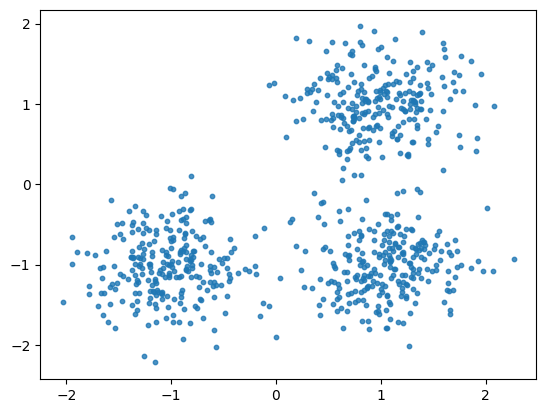

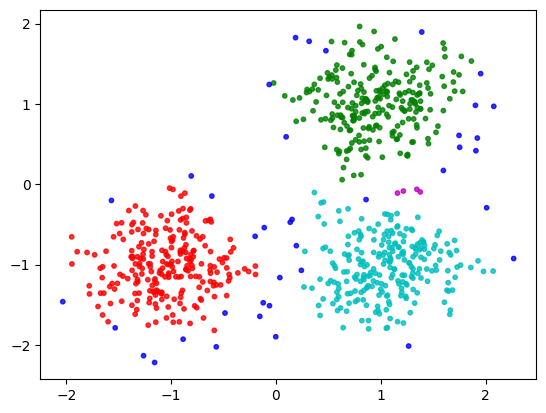

In [30]:
import numpy as np
import matplotlib.pyplot as plt
import sklearn.datasets as datasets

centers = [[1, 1], [-1, -1], [1, -1]]
X, _ = datasets.make_blobs(n_samples=750, centers=centers, cluster_std=0.4,
                            random_state=0)
plt.scatter(X[:,0],X[:,1],s=10, alpha=0.8)
plt.show()

class DBC():

    def __init__(self, dataset, min_pts, epsilon):
        self.dataset = dataset
        self.min_pts = min_pts
        self.epsilon = epsilon
        self.assignments = [0 for _ in range(len(self.dataset))]  #0 means not assigned
    
    def distance(self,i,j):
        #returns euclidean distance
        return np.linalg.norm(self.dataset[i]-self.dataset[j]) 

    def get_neighborhood(self,i):
        neighborhood=[]
        for j in range(len(self.dataset)):
            if self.distance(i,j)<=self.epsilon and i!=j:
                neighborhood.append(j)

        return neighborhood

    def is_core(self,i):

        return len(self.get_neighborhood(i))>=self.min_pts

    def assign(self,i,cluster_num):
        self.assignments[i]=cluster_num
        neighbor_queue=self.get_neighborhood(i)

        while neighbor_queue:
            next_candidate= neighbor_queue.pop()
            if self.assignments[next_candidate]!=0: #already assigned
                #duplicates can occur when adding points in neighbourhoods that haven't been assigned
                continue
            self.assignments[next_candidate]=cluster_num
            if self.is_core(next_candidate):
                next_neighborhood = self.get_neighborhood(next_candidate)
                neighbor_queue+=[i for i in next_neighborhood if self.assignments[i]==0]
        return 


    def dbscan(self):
        """
        returns a list of assignments. The index of the
        assignment should match the index of the data point
        in the dataset.
        """
        cluster_num=1
        for i in range (len(self.dataset)):
            if self.is_core(i) and self.assignments[i]==0:
                self.assign(i,cluster_num)
                cluster_num+=1
            
        return self.assignments

clustering = DBC(X, 3, .2).dbscan()
colors = np.array([x for x in 'bgrcmykbgrcmykbgrcmykbgrcmyk'])
colors = np.hstack([colors] * 40)
plt.scatter(X[:, 0], X[:, 1], color=colors[clustering].tolist(), s=10, alpha=0.8)
plt.show()


## Challenge Problem

Using the code above and the template provided below, create the animation below of the DBScan algorithm.

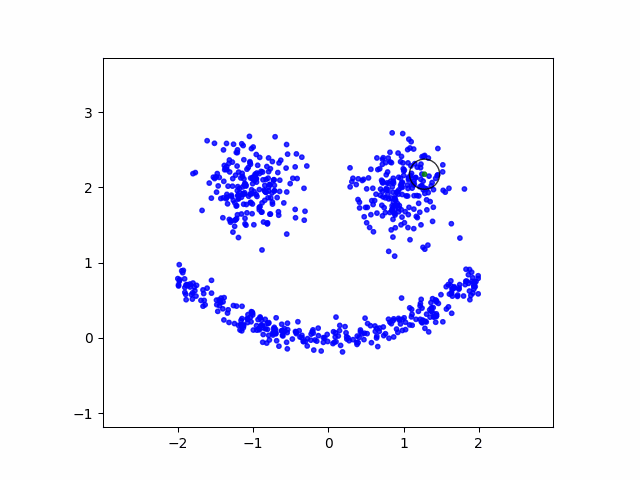

In [3]:
from IPython.display import Image
Image(filename="dbscan_2.gif", width=500, height=500)

Hints:

- First animate the dbscan algorithm for the dataset used in class (before trying to create the above dataset)
- Take a snapshot of the assignments when the point gets assigned to a cluster
- Confirm that the snapshot works by saving it to a file
- Don't forget to close the matplotlib plot after saving the figure
- Gather the snapshots in a list of images that you can then save as a gif using the code below
- Use `ax.set_aspect('equal')` so that the circles don't appear to be oval shaped
- To create the above dataset you need two blobs for the eyes. For the mouth you can use the following process to generate (x, y) pairs:
  - Pick an x at random in an interval that makes sense given where the eyes are positioned
  - For that x generate y that is 0.2 * x^2 plus a small amount of randomness
  - `zip` the x's and y's together and append them to the dataset containing the blobs

In [28]:
import numpy as np
from PIL import Image as im
import matplotlib.pyplot as plt
import sklearn.datasets as datasets

TEMPFILE = 'temp.png'

class DBC():

    def __init__(self, dataset, min_pts, epsilon):
        self.dataset = dataset
        self.min_pts = min_pts 
        self.epsilon = epsilon
        self.snaps = []
        self.clusters = {}
        for i in range(len(self.dataset)):
            self.clusters[i] = 0


    def snapshot(self, P):
        fig, ax = plt.subplots()
        colors = np.hstack([np.array([x for x in 'bgrcmykbgrcmykbgrcmykbgrcmyk'])] * 20)

        ax.scatter(self.dataset[:, 0], self.dataset[:, 1], color=colors[list(self.clusters.values())].tolist(), s = 7)
        cir = plt.Circle((self.dataset[P][0], self.dataset[P][1]), 0.2, fill = False, edgecolor ='black') # create circle around the point assigned
        ax.add_patch(cir)
        ax.set_xlim(-3,3)
        ax.set_ylim(-1,4)
        ax.set_aspect('equal') # necessary or else the circles appear to be oval shaped

        fig.savefig(TEMPFILE)
        plt.close()

        return im.fromarray(np.asarray(im.open(TEMPFILE)))


    def get_neighbors(self, P):
        neighbors = []
    
        for Pn in range(len(self.dataset)):
            if np.linalg.norm(self.dataset[P] - self.dataset[Pn]) < self.epsilon:
                neighbors.append(Pn)
            
        return neighbors
    
    def grow_cluster(self, P, neighbors, C):
        self.clusters[P] = C
        self.snaps.append(self.snapshot(P))

        i = 0
        while i < len(neighbors):    
            Pn = neighbors[i]

            if self.clusters[Pn] == -1:
                self.clusters[Pn] = C
                self.snaps.append(self.snapshot(Pn))
            elif self.clusters[Pn] == 0:
                self.clusters[Pn] = C
                self.snaps.append(self.snapshot(Pn))

                Pneighbors = self.get_neighbors(Pn)

                if len(Pneighbors) >= self.min_pts:
                    neighbors = neighbors + Pneighbors
            i += 1 

    def dbscan(self):
        """
        returns a list of assignments. The index of the
        assignment should match the index of the data point
        in the dataset.
        """
        C = 0
        for P in range(len(self.dataset)):
            if self.clusters[P]!=0:
                continue
            else:
                neighbors = self.get_neighbors(P)
                
                if len(neighbors) < self.min_pts:
                    self.clusters[P] = -1
                else:
                    C = C+1
                    self.grow_cluster(P, neighbors, C)
                    
        return list(self.clusters.values())


centers = [[-1, 2], [1, 2]]
eyes, _ = datasets.make_blobs(n_samples=400, centers=centers, cluster_std=0.25, random_state=0)

mouth_x = 4 * np.random.random(200) - 2
mouth_y = mouth_x**(2)/4 + .1 * np.random.randn(200)

face = np.append(eyes, np.array(list(zip(mouth_x,mouth_y))), axis=0)

dbc = DBC(face, 3, 0.2)
clustering = dbc.dbscan()

dbc.snaps[0].save(
    'dbscan.gif',
    optimize=False,
    save_all=True,
    append_images=dbc.snaps[1:],
    loop=0,
    duration=25
)

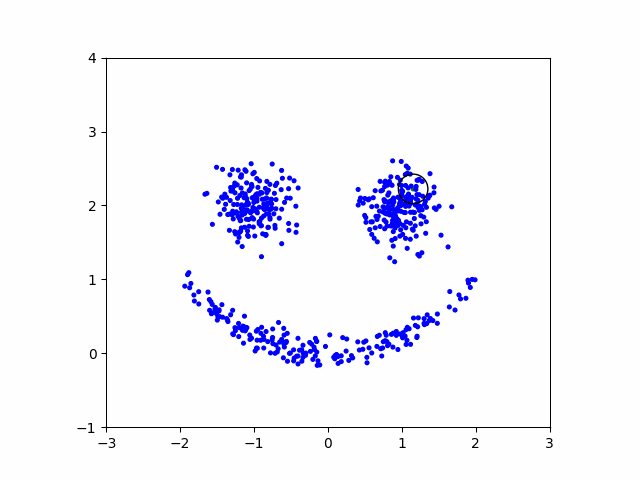

In [29]:
Image(filename="dbscan.gif", width=500, height=500)